0번: "isolate the main plant or the plant things from the background"
1번: isolate the main plant or fruit from the background
2번: isolate the main plant or flower or branch from the background
3번: isolate the main plant or flower or fruit from the background
4번: isolate the only plant with out sand from the background
5번: isolate the main plant or the plant things from the background
6번: isolate the plant things and flowers from the background
8번: isolate the sand plants from the background
9번: isolate the dry plants and flower from the background
10번: isolate the plants or flower from the background

In [2]:
import os
from PIL import Image
import numpy as np
from lang_sam import LangSAM
from PIL import Image
from lang_sam import LangSAM

# LangSAM 모델 초기화
model = LangSAM()

# 이미지 불러오기
image_pil = Image.open("/root/7416946.jpeg").convert("RGB")

# 텍스트 프롬프트 설정
text_prompt = "plant things"

# 객체 분할 예측
masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)


/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3423.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


/usr/local/lib/python3.8/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


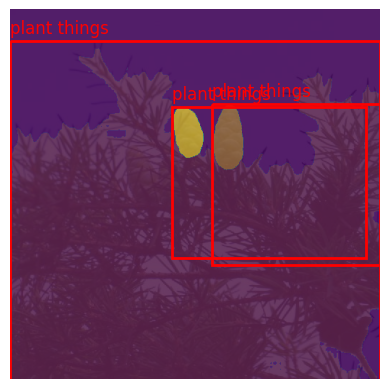

In [3]:
import matplotlib.pyplot as plt
plt.imshow(image_pil)
for mask, box, phrase in zip(masks, boxes, phrases):
    # 마스크와 바운딩 박스 시각화
    plt.imshow(mask, alpha=0.5)
    x, y, w, h = box
    plt.gca().add_patch(plt.Rectangle((x, y), w, h, fill=False, edgecolor='r', linewidth=2))
    # 텍스트 설명 추가
    plt.text(x, y - 10, phrase, fontsize=12, color='r')
plt.axis('off')
plt.show()

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])
Number of segmented images: 48


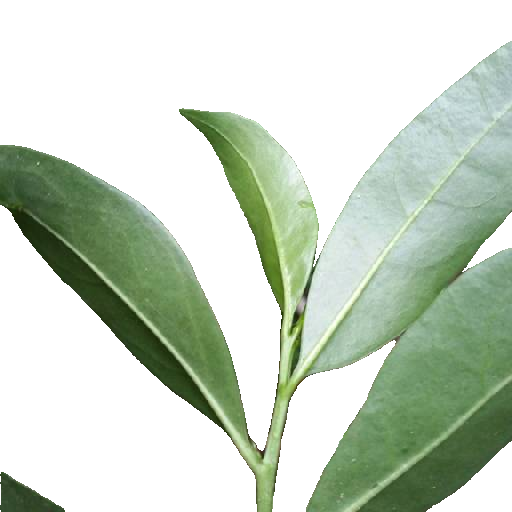

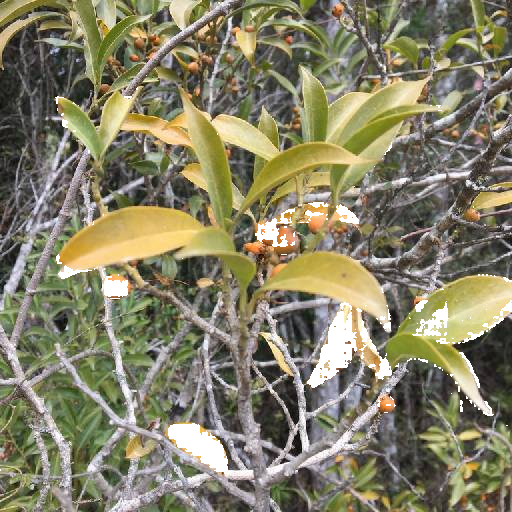

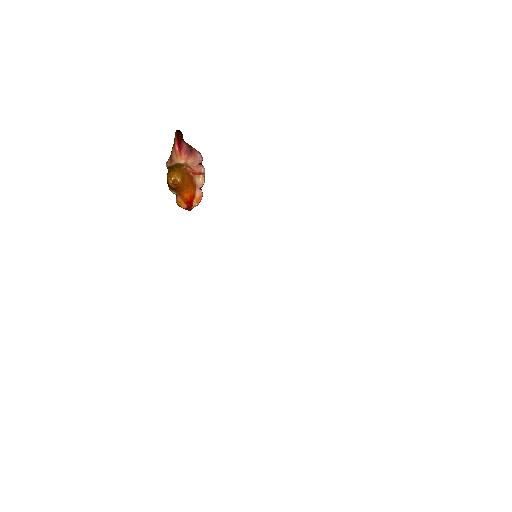

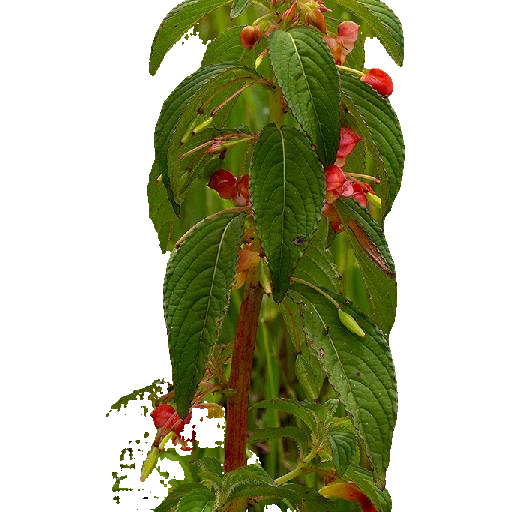

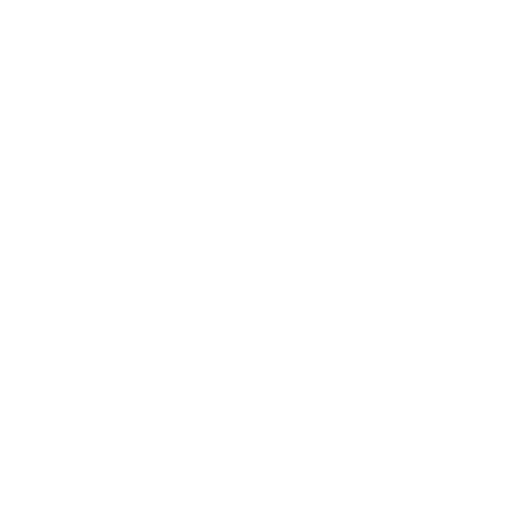

...

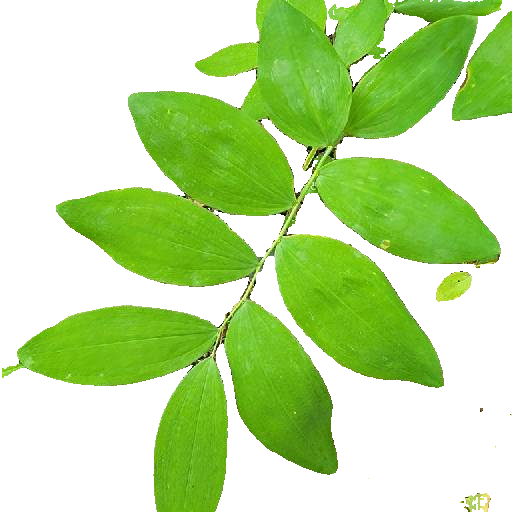

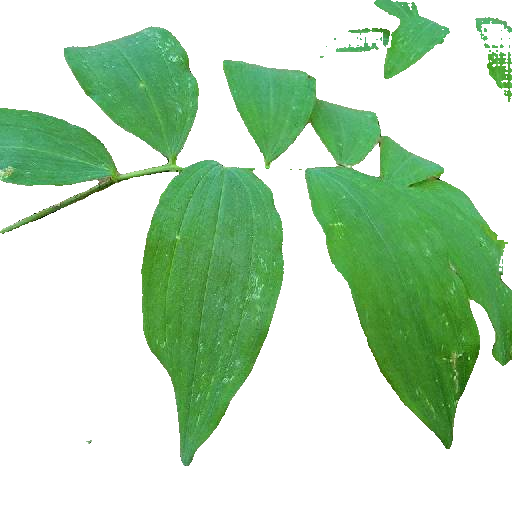

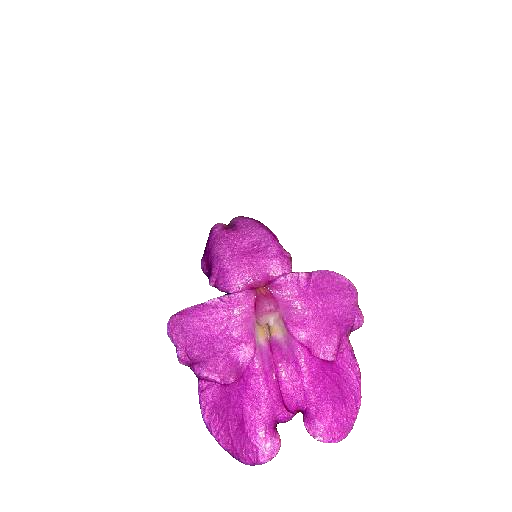

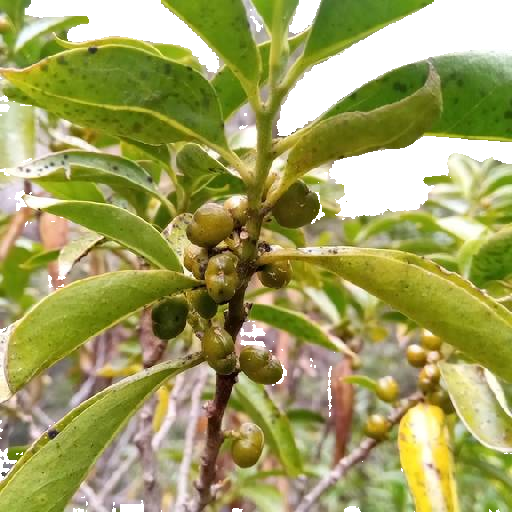

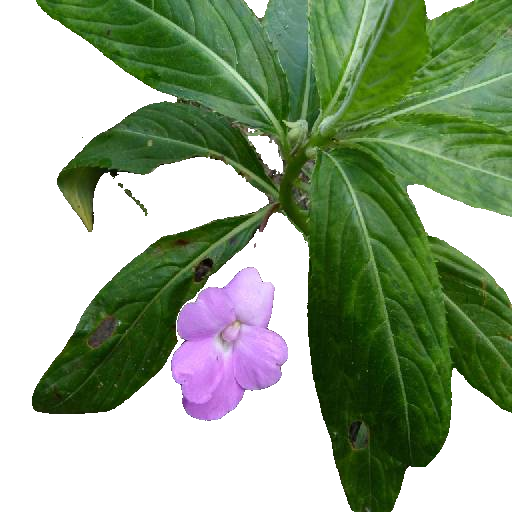

In [4]:
import os
from PIL import Image
import numpy as np
from lang_sam import LangSAM

def segment_images(folder_path, text_prompt, max_images=50):
    # LangSAM 모델 초기화
    model = LangSAM()

    # 폴더 내 이미지 파일들의 리스트 생성
    image_files = os.listdir(folder_path)

    # 최대 max_images개만 처리
    image_files = image_files[:max_images]

    processed_images = []

    # 선택된 이미지 파일들에 대해 반복
    for filename in image_files:
        try:
            # 이미지 파일 경로 생성
            image_path = os.path.join(folder_path, filename)
            
            # 이미지 불러오기 및 알파 채널 제거
            image_pil = Image.open(image_path).convert("RGB")
            image_np = np.array(image_pil)
            
            # 객체 분할 예측
            masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)
            
            # 배경을 흰색으로 설정
            result_image_np = np.ones_like(image_np, dtype=np.uint8) * 255  # 흰색 배경

            # 마스크 적용된 부분만 원본 이미지 유지
            for mask in masks:
                mask_np = np.array(mask)
                result_image_np[mask_np] = image_np[mask_np]

            # 결과 이미지를 PIL 이미지로 변환
            result_image = Image.fromarray(result_image_np, 'RGB')

            # 결과를 processed_images 리스트에 추가
            processed_images.append(result_image)

        except Exception as e:
            print(f"Error processing {filename}: {e}")

    return processed_images

# 실행 예제
folder_path = "/root/sorted_images/10"
text_prompt = "isolate the plants or flower from the background"

# 세그멘테이션된 이미지 리스트를 반환
segmented_images = segment_images(folder_path, text_prompt)

# 세그멘테이션된 이미지 개수 출력
print(f"Number of segmented images: {len(segmented_images)}")

# 세그멘테이션된 이미지를 출력
for idx, img in enumerate(segmented_images):
    img.show(title=f"Segmented Image {idx+1}")


In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from lang_sam import LangSAM

def segment_and_save_image(image_path, text_prompt, save_dir=None):
    # LangSAM 모델 초기화
    model = LangSAM()

    # 이미지 불러오기
    image_pil = Image.open(image_path).convert("RGB")
    image_np = np.array(image_pil)

    # 객체 분할 예측
    masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

    # 마스크를 원본 이미지에 덮어씌우기 (약간 투명한 파란색)
    for mask in masks:
        mask_np = np.array(mask)
        blue_mask = np.zeros_like(image_np, dtype=np.uint8)
        blue_mask[:, :] = [0, 0, 255]  # 파란색
        alpha = 0.3  # 투명도 (0.0에서 1.0 사이의 값, 1.0은 불투명)
        image_np = np.where(mask_np[:, :, None], (alpha * blue_mask + (1 - alpha) * image_np).astype(np.uint8), image_np)

    # 덮어씌운 이미지를 PIL 이미지로 변환
    result_image = Image.fromarray(image_np)

    # 이미지 저장
    if save_dir:
        # 저장할 디렉토리 생성
        os.makedirs(save_dir, exist_ok=True)

        # 저장할 파일 경로 생성
        image_name = os.path.basename(image_path)
        save_path = os.path.join(save_dir, image_name)

        # 이미지 저장
        result_image.save(save_path)

    # 결과 이미지 시각화
    plt.figure(figsize=(10, 5))
    plt.imshow(result_image)
    plt.axis('off')
    plt.title("Segmented Image with Prompt: " + text_prompt)
    plt.show()

# 실행 예제 및 저장
image_path = "/root/train_images"  # 예시 이미지 경로
text_prompt = "plant things"
save_dir = "/root/segmented_images"  # 저장할 디렉토리 경로

segment_and_save_image(image_path, text_prompt, save_dir)


In [7]:
import os
from PIL import Image
import numpy as np
from lang_sam import LangSAM

def segment_images(folder_path, output_folder, text_prompt):
    # LangSAM 모델 초기화
    model = LangSAM()

    # 폴더 내 이미지 파일들의 리스트 생성
    image_files = os.listdir(folder_path)

    # 출력 폴더가 존재하지 않으면 생성
    os.makedirs(output_folder, exist_ok=True)

    # 선택된 이미지 파일들에 대해 반복
    for filename in image_files:
        try:
            # 이미지 파일 경로 생성
            image_path = os.path.join(folder_path, filename)
            
            # 이미지 불러오기 및 알파 채널 제거
            image_pil = Image.open(image_path).convert("RGB")
            image_np = np.array(image_pil)
            
            # 객체 분할 예측
            masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)
            
            # 배경을 흰색으로 설정
            result_image_np = np.ones_like(image_np, dtype=np.uint8) * 255  # 흰색 배경

            # 마스크 적용된 부분만 원본 이미지 유지
            for mask in masks:
                mask_np = np.array(mask)
                result_image_np[mask_np] = image_np[mask_np]

            # 결과 이미지를 PIL 이미지로 변환
            result_image = Image.fromarray(result_image_np, 'RGB')

            # JPEG 형식으로 저장
            output_path = os.path.join(output_folder, filename)
            result_image.save(output_path, format='JPEG')

        except Exception as e:
            print(f"Error processing {filename} in {folder_path}: {e}")

# 폴더와 프롬프트 설정
folders_and_prompts = {
    "0": "isolate the main plant or the plant things from the background",
    "1": "isolate the main plant or fruit from the background",
    "2": "isolate the main plant or flower or branch from the background",
    "3": "isolate the main plant or flower or fruit from the background",
    "4": "isolate the only plant with out sand from the background",
    "5": "isolate the main plant or the plant things from the background",
    "6": "isolate the plant things and flowers from the background",
    "8": "isolate the sand plants from the background",
    "9": "isolate the dry plants and flower from the background",
    "10": "isolate the plants or flower from the background"
}

# 기본 경로 설정
base_input_path = "/root/sorted_images"
base_output_path = "/root/segmented_sort"

# 모든 폴더에 대해 세그멘테이션 수행 및 하나의 폴더에 저장
for folder, prompt in folders_and_prompts.items():
    input_path = os.path.join(base_input_path, folder)
    output_path = os.path.join(base_output_path, folder)
    segment_images(input_path, output_path, prompt)


final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


ValueError: Problem loading SAM please make sure you have the right model type: vit_h                     and a working checkpoint: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth. Recommend deleting the checkpoint and                     re-downloading it.

In [8]:
import PIL
print(PIL.__file__)


/usr/local/lib/python3.8/dist-packages/PIL/__init__.py
